In [1]:
import os, sys
import numpy as np
import h5netcdf

import xarray as xr
import xarray.ufuncs as xu
import pandas as pd

from matplotlib import pyplot as plt
from matplotlib import colors
import cartopy.crs as ccrs
import cartopy

plt.rc("figure", figsize=(18,8))
plt.rc("font", size=14)
ccrs.PlateCarree()

from dask.distributed import Client, LocalCluster
cluster = LocalCluster(processes=False, n_workers=1, threads_per_worker=8)
client = Client(cluster)
client

/home/durandy/miniconda3/envs/towel/lib/python3.9/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 45145 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://137.129.155.67:45145/status,
Dashboard: http://137.129.155.67:45145/status,Workers: 1
Total threads: 8,Total memory: 78.61 GiB
Status: running,Using processes: False
Comm: inproc://137.129.155.67/53079/1,Workers: 1
Dashboard: http://137.129.155.67:45145/status,Total threads: 8
Started: Just now,Total memory: 78.61 GiB
Comm: inproc://137.129.155.67/53079/3,Total threads: 8
Dashboard: http://137.129.155.67:42621/status,Memory: 78.61 GiB
Nanny: None,


# Méthodes
## Comparaison entre la climatologie NO-Smothed et la climatologie Smothed
### Notation
##### Décompostion d'un variable
On peut décomposer une variable X de cette façon :
\begin{equation}
X= \overline{x} + x^{*} \\
\text{$\overline{x}$ est la moyenne et $x^{*}$ est l'anomalie.}
\end{equation}

##### Méthode de calcul pour $\overline{x}$

\begin{equation}
\overline{x} = \frac{\displaystyle\sum_{i=1}^{n_j}{x_i}}{n_j}
\end{equation}
et 

\begin{equation}
< \overline{x}_{y} >_h  = FiltreHarmonique(\overline{x})\\
\text{$\overline{x}$ est la moyenne brute, $y$ la période et $h$ le nombre d'harmonique gardée.}
\end{equation}

# Objectifs
On souhaite vérifier la climatologie pour différente valeurs de h et de y, plus spécifiquempent pour la période Toucan de 2012 à 2016.

In [2]:
indir_smot = '/cnrm/tropics/commun/DATACOMMUN/WAVE/NO_SAVE/DATA/SMOTHED_CLIM/'
indir_brut = '/cnrm/tropics/commun/DATACOMMUN/WAVE/NO_SAVE/DATA/RAW_CLIM/'
output_fig = '/cnrm/tropics/commun/DATACOMMUN/WAVE/RAPPORT/FIGURES/CLIM/'

var = 'tcwv'

ds_brut = xr.open_mfdataset(indir_brut+'clim_tcwv_brut_ERA5_3H_2012_2016.nc', chunks = {'time' : 1}, engine="h5netcdf", parallel=True)
ds_smot = xr.open_mfdataset(indir_smot+'*'+var+'*2020.nc', chunks = {'time' : 1}, parallel=True)
ds_smot_3h = xr.open_mfdataset(indir_smot+'*'+var+'*2020_3harm.nc', chunks = {'time' : 1}, engine="h5netcdf", parallel=True)
ds_smot = ds_smot_3h
ds_smot_4h = xr.open_mfdataset(indir_smot+'*'+var+'*2020_4harm.nc', chunks = {'time' : 1}, parallel=True)

ds_brut = ds_brut.sel(latitude = slice(40.1,-40.1))
ds_smot = ds_smot.sel(latitude = slice(40.1,-40.1))

ds_smot_T_3h = xr.open_dataset(indir_smot + 'clim_tcwv_smooth_ERA5_3H_2012_2016_3harm.nc', chunks = {'time' : 1})
ds_smot_T_4h = xr.open_dataset(indir_smot + 'clim_tcwv_smooth_ERA5_3H_2012_2016_4harm.nc', chunks = {'time' : 1})
ds_smot_T_5h = xr.open_dataset(indir_smot + 'clim_tcwv_smooth_ERA5_3H_2012_2016_5harm.nc', chunks = {'time' : 1})



In [13]:
### Suppresion du biais entre les deux climatologies, (30 ans et Toucan)
# _mean_diff_ds = ds_smot_T_3h.mean('time') - ds_smot_3h.mean('time')
# _ds_smot_T_3h = (ds_smot_T_3h - _mean_diff_ds).load()
# _ds_smot_T_3h.to_netcdf(indir_smot + 'clim_tcwv_smooth_ERA5_3H_2012_2016_3harm_without_biais.nc')

# Verification 1D entre les données brutes et les données smoothed
Cette vérification est faite sur trois points du globe, Afrique, Océan Indien et Océan Pacifique

\begin{equation}
Y_{plot} = \overline{x_{2012-2016}} \\
Y_{plot} = < \overline{x}_{y} >_h  \\
\end{equation}

\begin{equation}
< \overline{x}_{30} >_3  = FiltreHarmonique(\overline{x})\\
\end{equation}


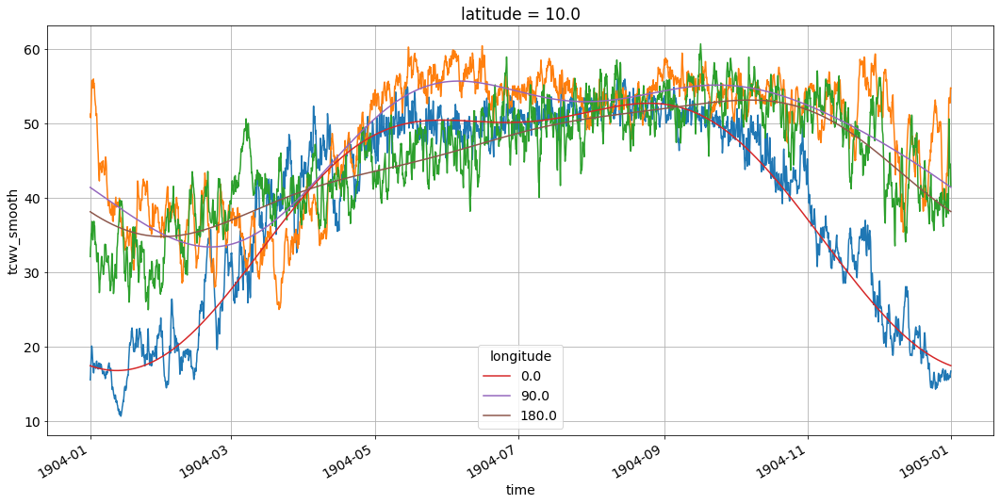

In [3]:
latitude = 10
longitude = [0, 90, 180]

plt.figure()
ds_brut['tcwv'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
ds_smot['tcwv_smooth'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()

\begin{equation}
< \overline{x}_{T} >_3  = FiltreHarmonique(\overline{x})\\
\end{equation}


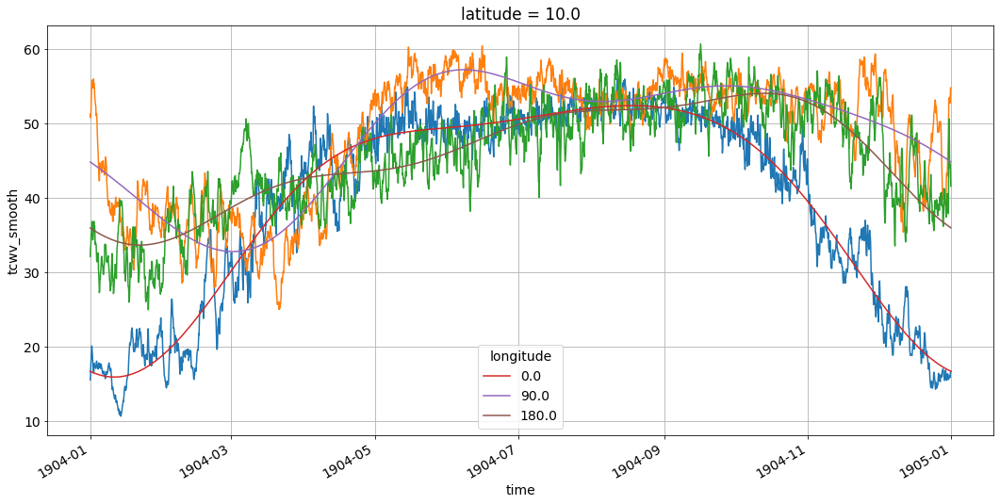

In [4]:
latitude = 10
longitude = [0, 90, 180]

plt.figure()
ds_brut['tcwv'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
ds_smot_T_3h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()

\begin{equation}
< \overline{x}_{T} >_4  = FiltreHarmonique(\overline{x})\\
\end{equation}


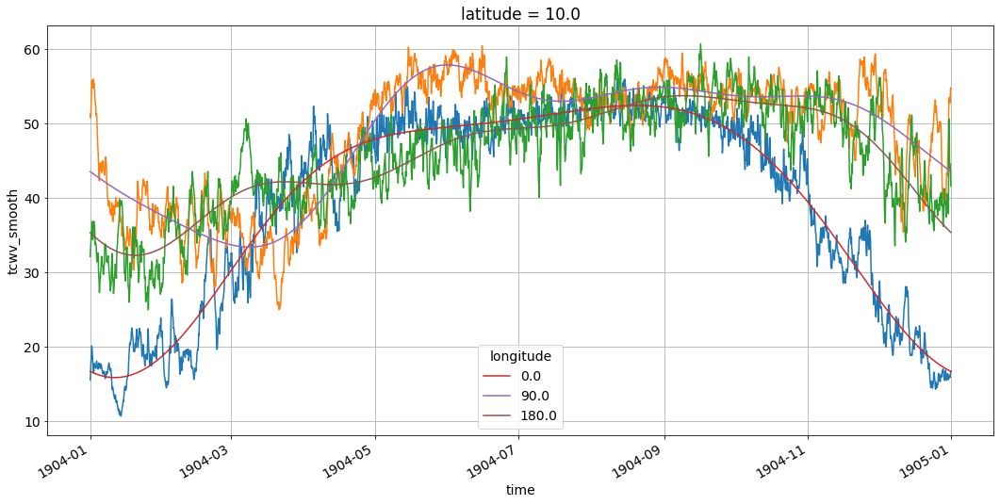

In [5]:
latitude = 10
longitude = [0, 90, 180]

plt.figure()
ds_brut['tcwv'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
ds_smot_T_4h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()

\begin{equation}
< \overline{x}_{T} >_5  = FiltreHarmonique(\overline{x})\\
\end{equation}


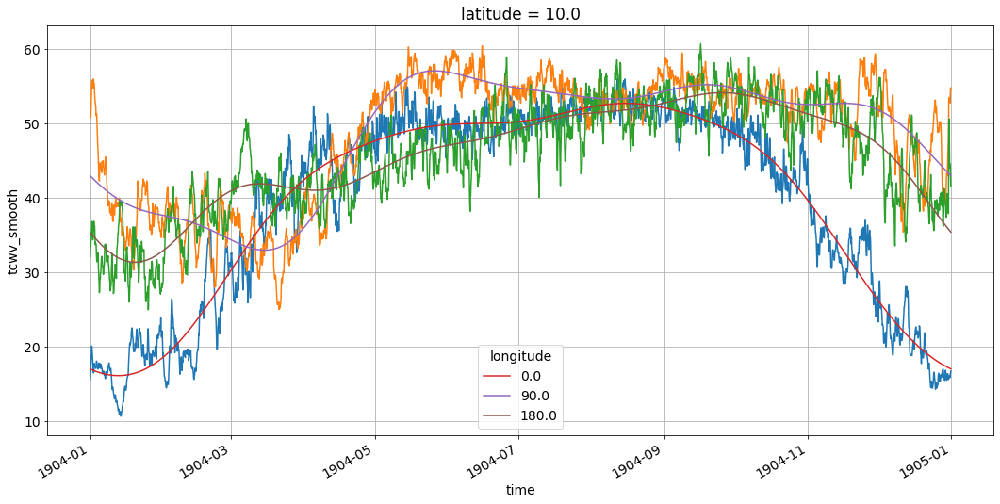

In [6]:
latitude = 10
longitude = [0, 90, 180]

plt.figure()
ds_brut['tcwv'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
ds_smot_T_5h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()

#### On plot la différence entre la climatologie brute et la climatologie smoothed
\begin{equation}
Y_{plot} = \overline{x} - < \overline{x}_{y} >_h  \\
\end{equation}



\begin{equation}
Y_{plot} = \overline{x} - < \overline{x}_{T} >_3  \\
\end{equation}

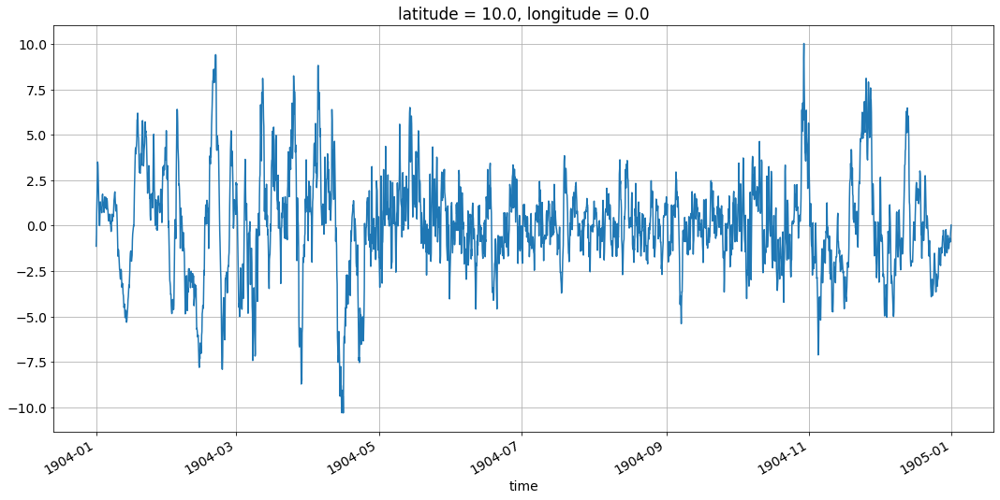

In [7]:
latitude = 10
longitude = 0
brut = ds_brut['tcwv'].sel(latitude = 10, longitude = longitude, method = 'nearest').compute()

diff = brut - ds_smot_T_3h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude)

plt.figure()
diff.plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()


\begin{equation}
Y_{plot} = \overline{x} - < \overline{x}_{T} >_4  \\
\end{equation}

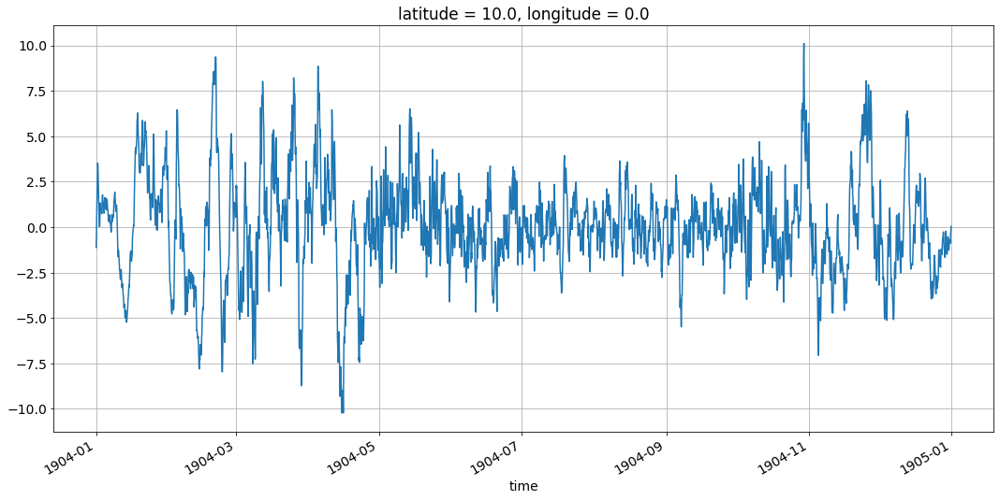

In [8]:
diff = brut - ds_smot_T_4h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude)

plt.figure()
diff.plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()


\begin{equation}
Y_{plot} = \overline{x} - < \overline{x}_{T} >_5  \\
\end{equation}

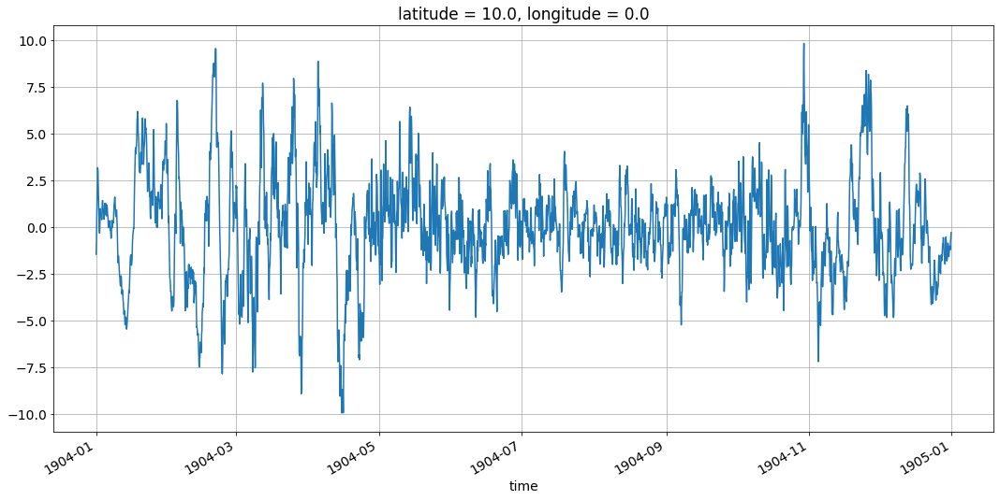

In [9]:
diff = brut - ds_smot_T_5h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude)

plt.figure()
diff.plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()

## Comparaison entre les différentes climatologies

On plot sur un même graphe les différentes climatologies

\begin{equation}
Y_{plot} = < \overline{x}_{30} >_3  \\
Y_{plot} = < \overline{x}_{T} >_3  \\
Y_{plot} = < \overline{x}_{T} >_4  \\
Y_{plot} = < \overline{x}_{T} >_5  \\
\end{equation}


<Figure size 1296x576 with 0 Axes>

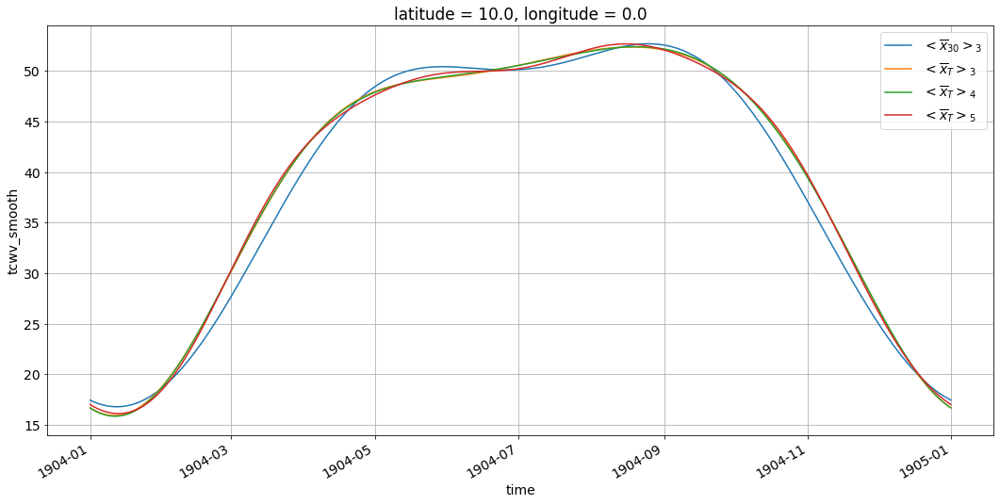

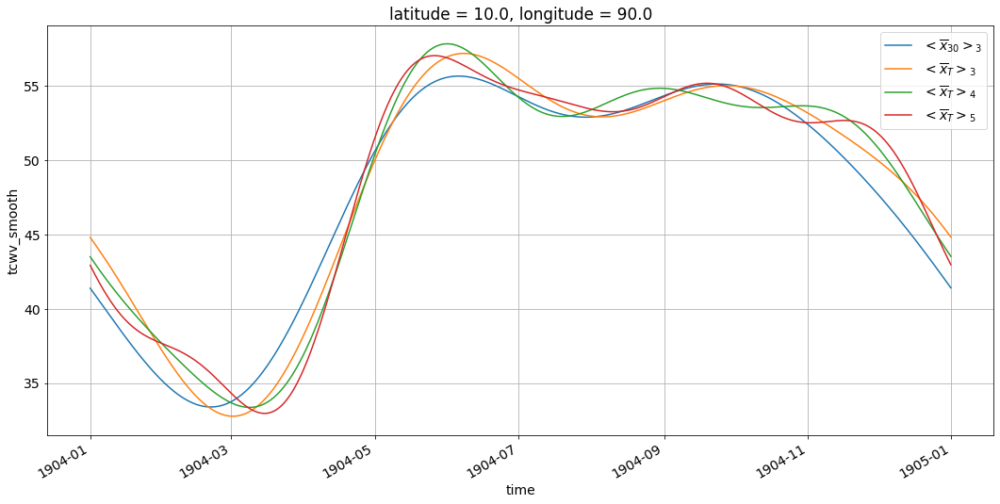

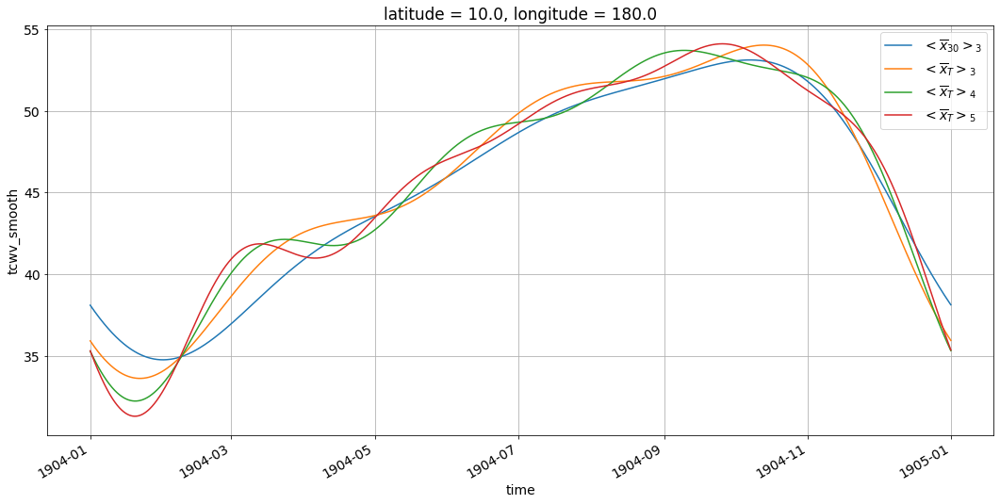

In [10]:
plt.figure()
latitude = 10
longitude = [0, 90, 180]
for x in longitude :
    plt.figure()
    ds_smot_3h['tcwv_smooth'].sel(latitude = latitude, longitude = x).plot(label = '$< \overline{x}_{30} >_3$')
#     ds_smot_4h['tcwv_smooth'].sel(latitude = latitude, longitude = x).plot(label = '$< \overline{x}_{30} >_4$')
    ds_smot_T_3h['tcwv_smooth'].sel(latitude = latitude, longitude = x).plot(label = '$< \overline{x}_{T} >_3$')
    ds_smot_T_4h['tcwv_smooth'].sel(latitude = latitude, longitude = x).plot(label = '$< \overline{x}_{T} >_4$')
    ds_smot_T_5h['tcwv_smooth'].sel(latitude = latitude, longitude = x).plot(label = '$< \overline{x}_{T} >_5$')
    plt.grid()
    plt.legend()
    plt.show()

# Comparaison des climatologies entre celle de 30 ans et celle de TOUCAN.
## Elle est réalisé au large de la Californie, au lieu ou il y avait le plus de différence. On remarque qu'il existe un biais.

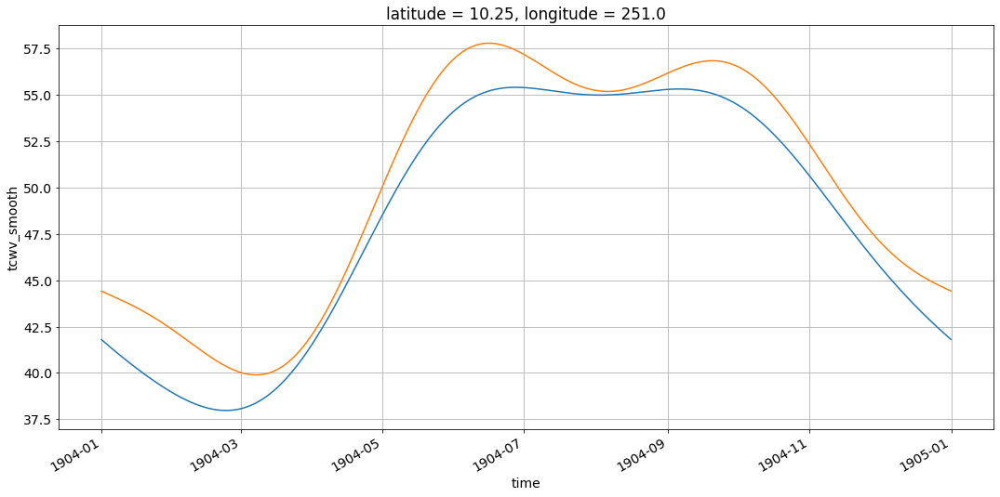

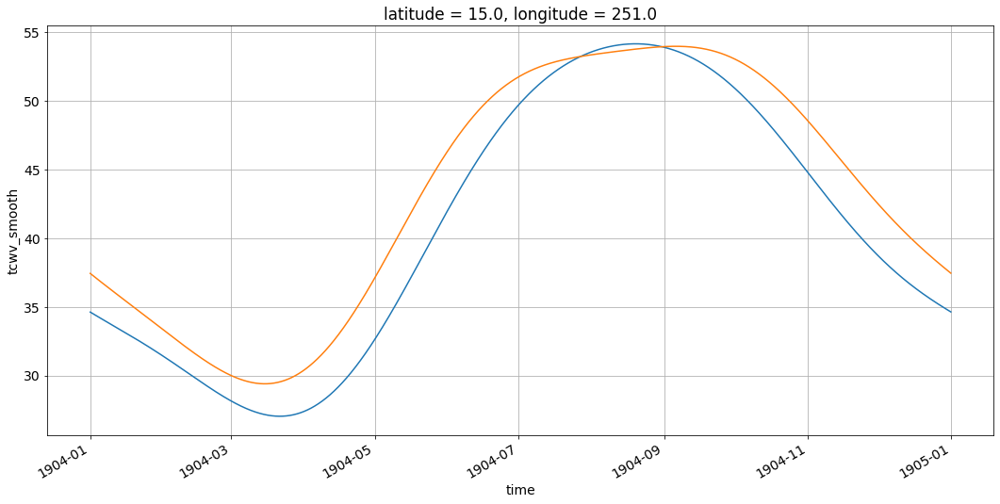

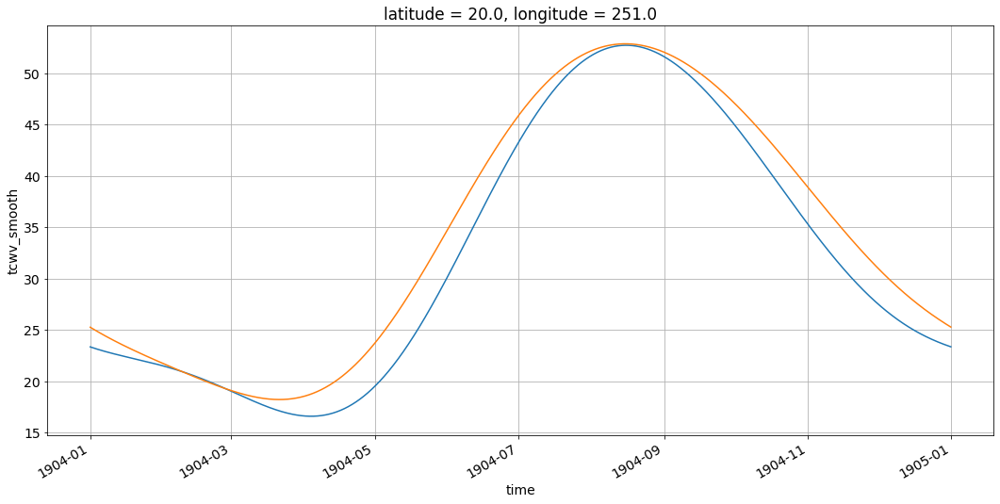

In [4]:
latitude = [10.3, 15, 20]
longitude = 251

for i in latitude :
    plt.figure()
    ds_smot['tcwv_smooth'].sel(latitude = i, longitude = longitude, method = 'nearest').plot()
    ds_smot_T_3h['tcwv_smooth'].sel(latitude = i, longitude = longitude, method = 'nearest').plot()

    # ds_smot_T_5h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
    plt.grid()
    # plt.legend()
    plt.show()

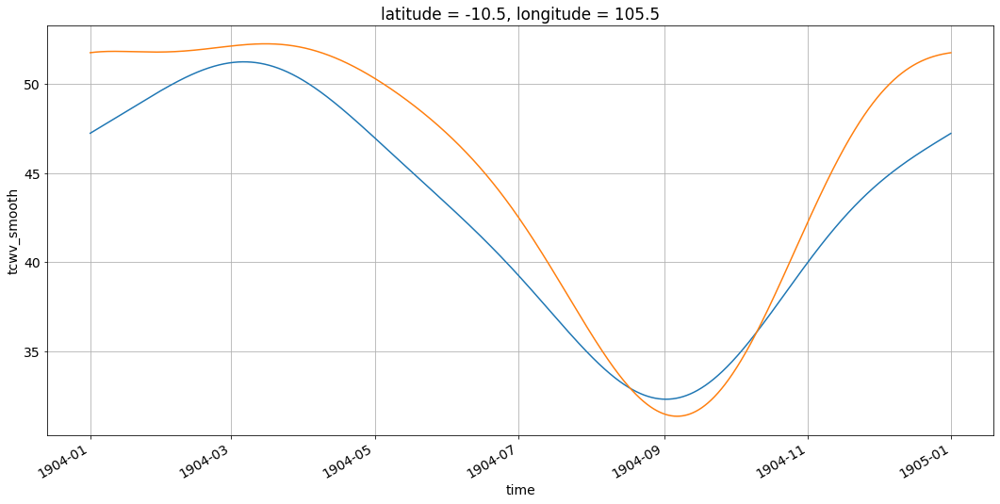

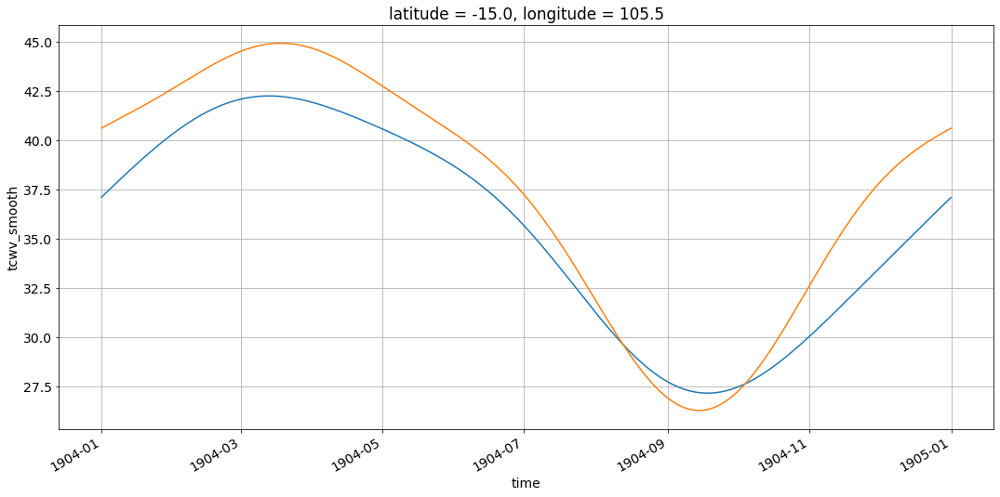

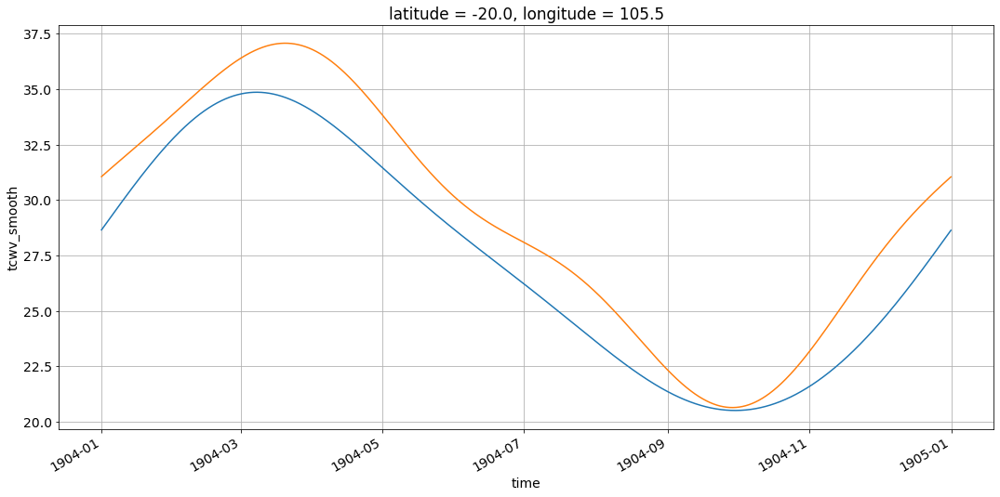

In [12]:
latitude = [-10.53, -15, -20] #First Christmas Isle
longitude = 105.62

for i in latitude :
    plt.figure()
    ds_smot['tcwv_smooth'].sel(latitude = i, longitude = longitude, method = 'nearest').plot()
    ds_smot_T_3h['tcwv_smooth'].sel(latitude = i, longitude = longitude, method = 'nearest').plot()

    # ds_smot_T_5h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
    plt.grid()
    # plt.legend()
    plt.show()

# On soustrais le biais sur la climatologie de la période TOUCAN
\begin{equation}
< \overline{x}_{T} >_3 =  < \overline{x}_{T} >_3 - biais
\end{equation}

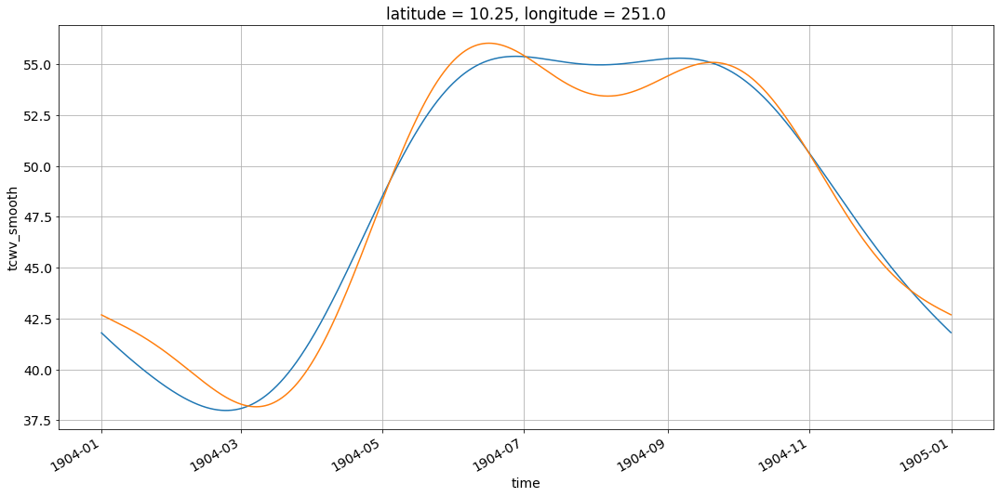

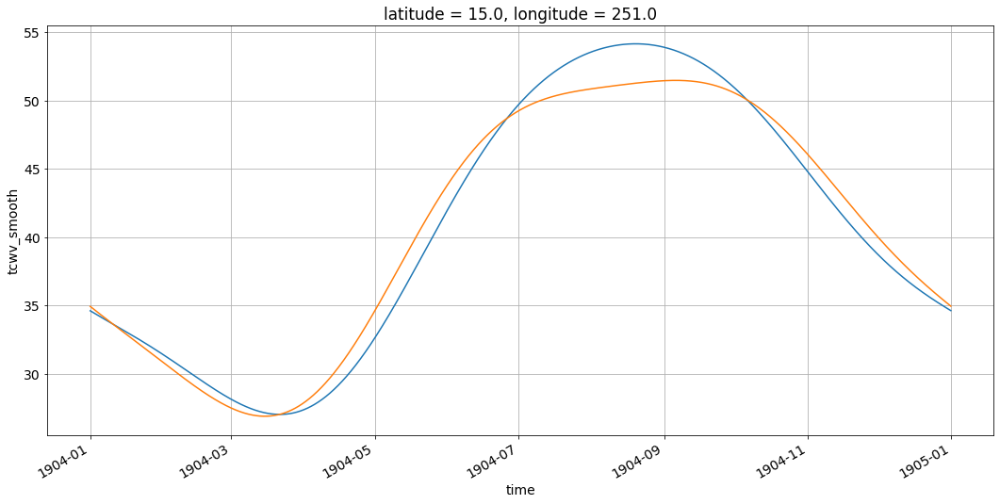

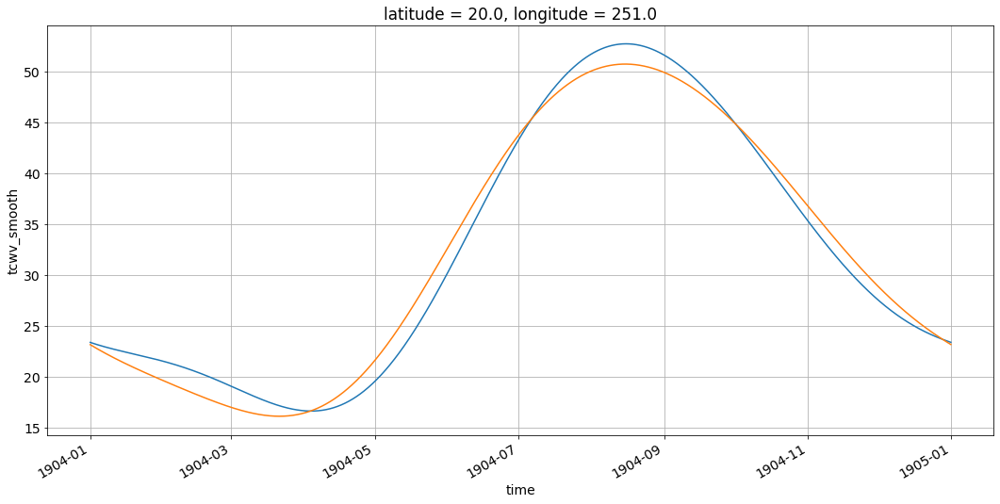

In [8]:
latitude = [10.3, 15, 20]
longitude = 251

for i in latitude :
    plt.figure()
    ds_smot['tcwv_smooth'].sel(latitude = i, longitude = longitude, method = 'nearest').plot()
    _ds_smot_T_3h['tcwv_smooth'].sel(latitude = i, longitude = longitude, method = 'nearest').plot()

    # ds_smot_T_5h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
    plt.grid()
    # plt.legend()
    plt.show()

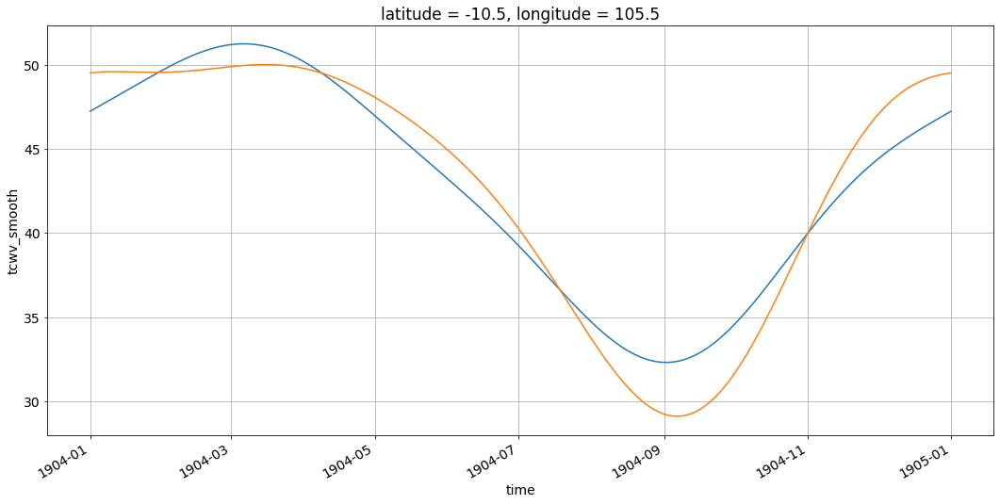

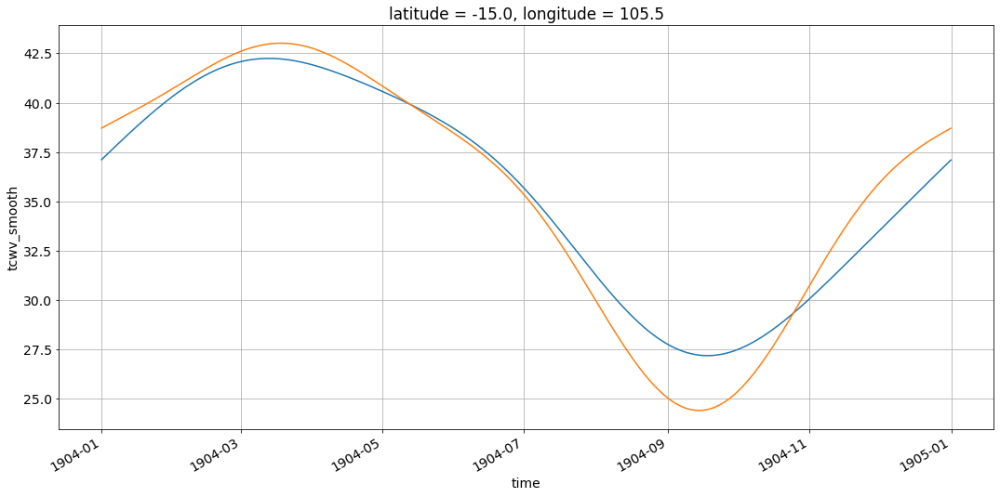

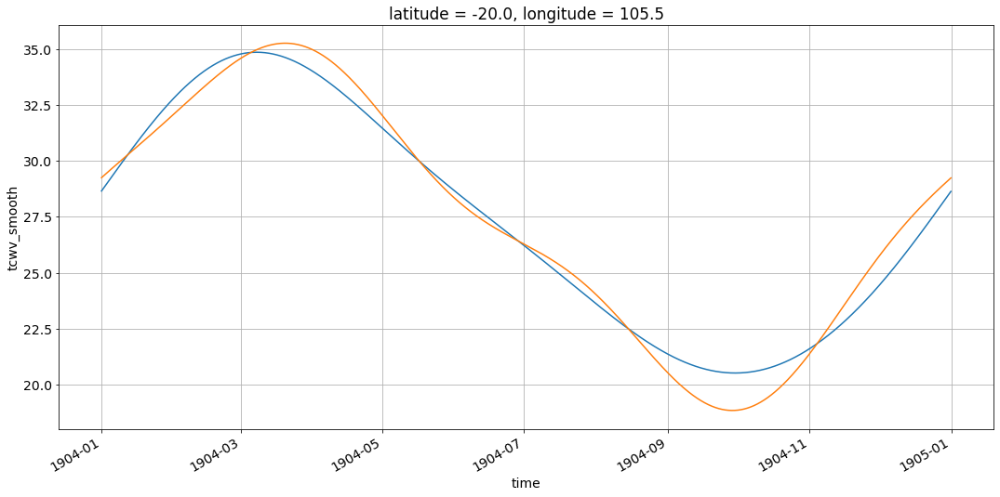

In [11]:
latitude = [-10.53, -15, -20] #First Christmas Isle
longitude = 105.62

for i in latitude :
    plt.figure()
    ds_smot['tcwv_smooth'].sel(latitude = i, longitude = longitude, method = 'nearest').plot()
    _ds_smot_T_3h['tcwv_smooth'].sel(latitude = i, longitude = longitude, method = 'nearest').plot()

    # ds_smot_T_5h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
    plt.grid()
    # plt.legend()
    plt.show()

# PWc - PWl

\begin{equation}
Y_{plot} = < \overline{x}_{30} >_3   - < \overline{x}_{T} >_h  \\
\end{equation}


\begin{equation}
Y_{plot} = < \overline{x}_{30} >_3   - < \overline{x}_{T} >_3  \\
\end{equation}

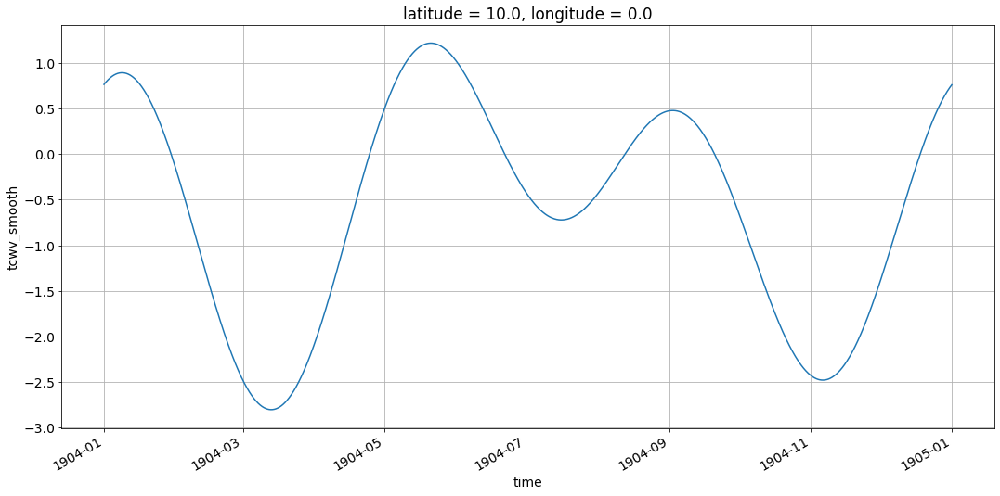

<xarray.DataArray 'tcwv_smooth' (time: 2928)>
dask.array<subtract, shape=(2928,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
    latitude   float32 10.0
    longitude  float32 0.0
  * time       (time) datetime64[ns] 1904-01-01 ... 1904-12-31T21:00:00

In [11]:
latitude = 10
longitude = 0

ds_smot_S = ds_smot.sel(latitude = latitude, longitude = longitude, method = 'nearest').load()

diff = ds_smot_S['tcwv_smooth'] - ds_smot_T_3h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude)

plt.figure()
diff.plot.line()
plt.grid()
# plt.legend()
plt.show()
diff

In [ ]:
latitude = 10
longitude = 0

ds_smot_S = ds_smot.sel(latitude = latitude, longitude = longitude, method = 'nearest').load()

diff = ds_smot_S['tcwv_smooth'] - _ds_smot_T_3h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude)

plt.figure()
diff.plot.line()
plt.grid()
# plt.legend()
plt.show()
diff

\begin{equation}
Y_{plot} = < \overline{x}_{30} >_3   - < \overline{x}_{T} >_4  \\
\end{equation}

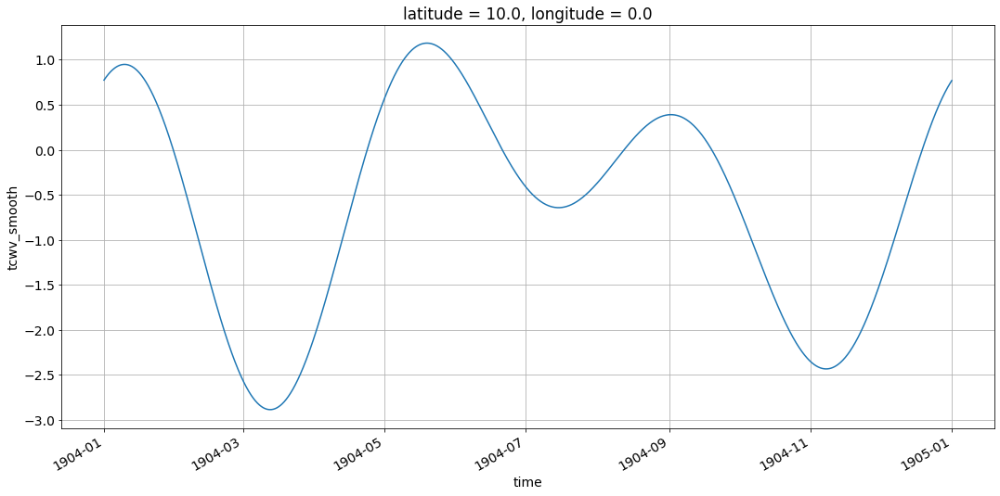

In [12]:
latitude = 10
longitude = 0

diff = ds_smot_S['tcwv_smooth'] - ds_smot_T_4h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude)

plt.figure()
diff.plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()

\begin{equation}
Y_{plot} = < \overline{x}_{30} >_3   - < \overline{x}_{T} >_5  \\
\end{equation}

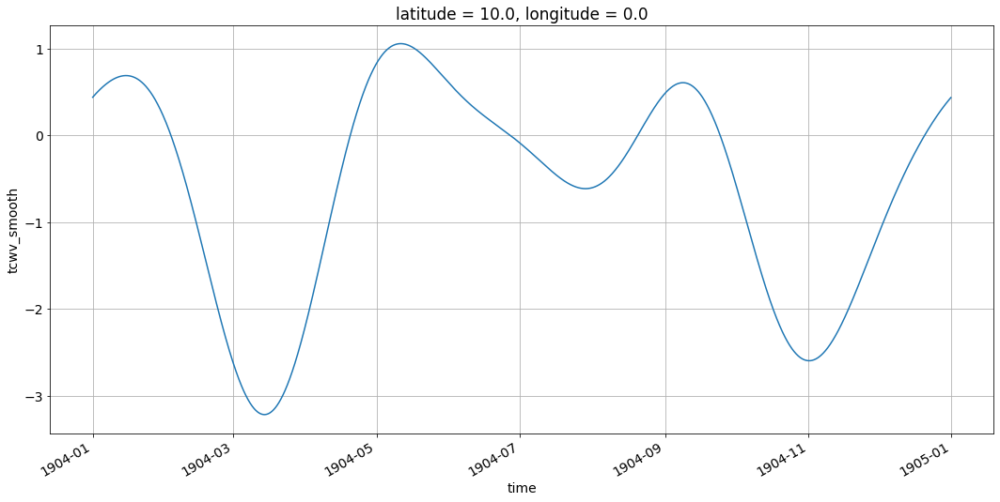

In [13]:
latitude = 10
longitude = 0

diff = ds_smot_S['tcwv_smooth'] - ds_smot_T_5h['tcwv_smooth'].sel(latitude = latitude, longitude = longitude)

plt.figure()
diff.plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()

# Verification 2D

\begin{equation}
RMSE = \sqrt{\frac{\displaystyle\sum_{i=1}^{n_j}{(< \overline{x}_{30} >_3 - < \overline{x}_{T} >_3})^2}{n_j}}\\
\text{$j$ de 1 à 12 ou de 1 à 4, $\mu$ la moyenne mensuelle ou saisonière, n le nombre de pas de temps $n_j = nbAnnee * nbJour_j * \frac{24}{3}$} \\[30pt]
\end{equation}

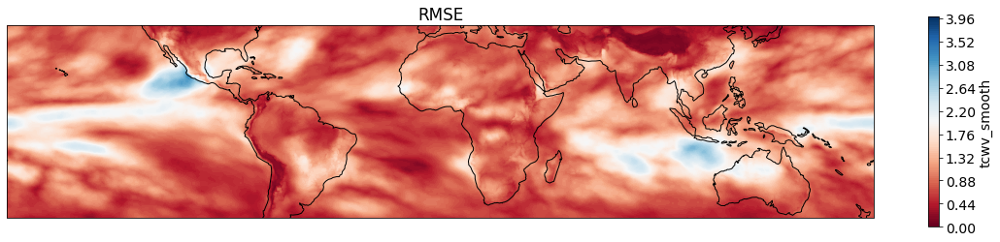

In [9]:
err2 = xu.square(ds_smot - ds_smot_T_3h)
err_tot = err2.sum('time')
RMSE = xu.sqrt(err_tot/ds_smot.time.size)
RMSE

varPlot = RMSE['tcwv_smooth'].load()

plt.figure(figsize=(20,4))
ax = plt.axes(projection=ccrs.PlateCarree())
p = varPlot.plot.contourf(levels = 101, vmax = 4,vmin = 0, cmap='RdBu')
#                                                       cbar_kwargs=colorbar)
ax.coastlines()
plt.title("RMSE")
plt.show()

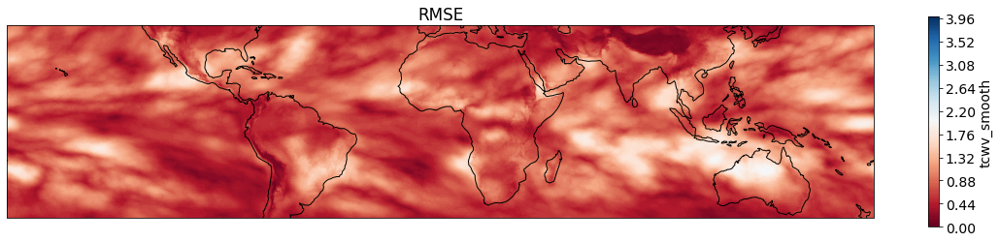

In [10]:
err2 = xu.square(ds_smot - _ds_smot_T_3h)
err_tot = err2.sum('time')
RMSE = xu.sqrt(err_tot/ds_smot.time.size)
RMSE

varPlot = RMSE['tcwv_smooth'].load()

plt.figure(figsize=(20,4))
ax = plt.axes(projection=ccrs.PlateCarree())
p = varPlot.plot.contourf(levels = 101, vmax = 4,vmin = 0, cmap='RdBu')
#                                                       cbar_kwargs=colorbar)
ax.coastlines()
plt.title("RMSE")
plt.show()

\begin{equation}
RMSE = \sqrt{\frac{\displaystyle\sum_{i=1}^{n_j}{(< \overline{x}_{30} >_3 - < \overline{x}_{T} >_4})^2}{n_j}}\\
\text{$j$ de 1 à 12 ou de 1 à 4, $\mu$ la moyenne mensuelle ou saisonière, n le nombre de pas de temps $n_j = nbAnnee * nbJour_j * \frac{24}{3}$} \\[30pt]
\end{equation}

In [16]:
err2 = xu.square(ds_smot - ds_smot_T_4h)
err_tot = err2.sum('time')
RMSE = xu.sqrt(err_tot/ds_smot.time.size)
RMSE

<xarray.Dataset>
Dimensions:      (latitude: 321, longitude: 1440)
Coordinates:
  * latitude     (latitude) float32 40.0 39.75 39.5 39.25 ... -39.5 -39.75 -40.0
  * longitude    (longitude) float32 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Data variables:
    tcwv_smooth  (latitude, longitude) float64 dask.array<chunksize=(321, 1440), meta=np.ndarray>

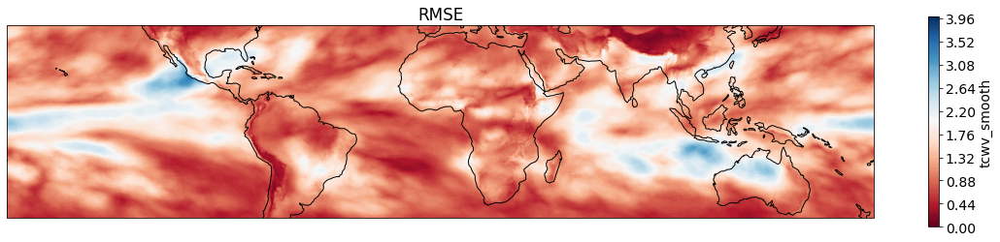

In [17]:
varPlot = RMSE['tcwv_smooth'].load()

plt.figure(figsize=(20,4))
ax = plt.axes(projection=ccrs.PlateCarree())
p = varPlot.plot.contourf(levels = 101, vmax = 4,vmin = 0, cmap='RdBu')
#                                                       cbar_kwargs=colorbar)
ax.coastlines()
plt.title("RMSE")
plt.show()

\begin{equation}
RMSE = \sqrt{\frac{\displaystyle\sum_{i=1}^{n_j}{(< \overline{x}_{30} >_3 - < \overline{x}_{T} >_5})^2}{n_j}}\\
\text{$j$ de 1 à 12 ou de 1 à 4, $\mu$ la moyenne mensuelle ou saisonière, n le nombre de pas de temps $n_j = nbAnnee * nbJour_j * \frac{24}{3}$} \\[30pt]
\end{equation}

In [18]:
err2 = xu.square(ds_smot - ds_smot_T_5h)
err_tot = err2.sum('time')
RMSE = xu.sqrt(err_tot/ds_smot.time.size)
RMSE

<xarray.Dataset>
Dimensions:      (latitude: 321, longitude: 1440)
Coordinates:
  * latitude     (latitude) float32 40.0 39.75 39.5 39.25 ... -39.5 -39.75 -40.0
  * longitude    (longitude) float32 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Data variables:
    tcwv_smooth  (latitude, longitude) float64 dask.array<chunksize=(321, 1440), meta=np.ndarray>

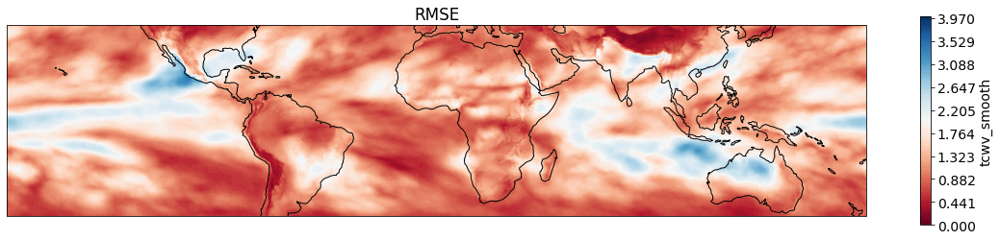

In [19]:
varPlot = RMSE['tcwv_smooth'].load()

plt.figure(figsize=(20,4))
ax = plt.axes(projection=ccrs.PlateCarree())
p = varPlot.plot.contourf(levels = 101, vmax = 4.01,vmin = 0, cmap='RdBu')
#                                                       cbar_kwargs=colorbar)
ax.coastlines()
plt.title("RMSE")
plt.show()


## Carte global de PW en moyenne mensuelle

\begin{equation}
\overline{tcwv^*}_j = \frac{\displaystyle\sum_{i=1}^{n_j} (< \overline{x}_{30} >_3)_i} {n_j} = \mu^{*}_j\\
\text{$j$ de 1 à 12 ou de 1 à 4, $\mu$ la moyenne mensuelle ou saisonière, n le nombre de pas de temps $n_j = nbAnnee * nbJour_j * \frac{24}{3}$} \\[30pt]
\end{equation}

In [20]:
ds_MMS = ds_smot.groupby('time.month').mean('time').load()
ds_MSS = ds_smot.groupby('time.season').mean('time').load()

ds_MMS_T = ds_smot_T_3h.groupby('time.month').mean('time').load()
ds_MSS_T = ds_smot_T_3h.groupby('time.season').mean('time').load()

In [21]:
#### Parameter for plotting
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(10.,60.1,2),
            'extend' : 'both'}
vmax = 60.
vmin = 10.
cmap ='RdBu'
size = 5

map_proj = ccrs.Mercator(central_longitude=0.0, 
                         min_latitude=-40.0, 
                         max_latitude=40.0, 
                         globe=None)

/home/durandy/miniconda3/envs/towel/lib/python3.9/site-packages/xarray/plot/facetgrid.py:394: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout()


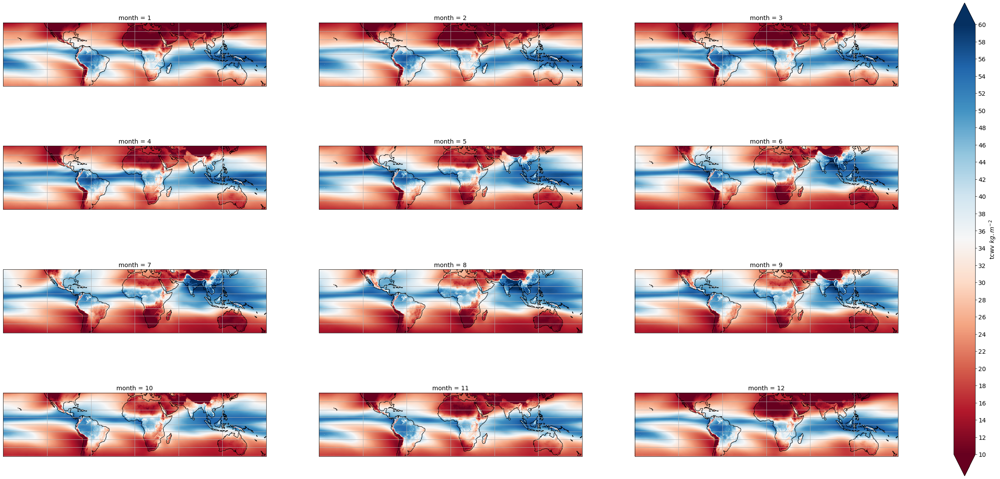

In [22]:


# plt.figure(figsize = (30,10))
p = ds_MMS['tcwv_smooth'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'month', col_wrap =3,
                               aspect = 3, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                               cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
    
plt.savefig(output_fig+'atlas_meanMonth_clim.png')  

#### Carte global de PW en moyenne saisonière

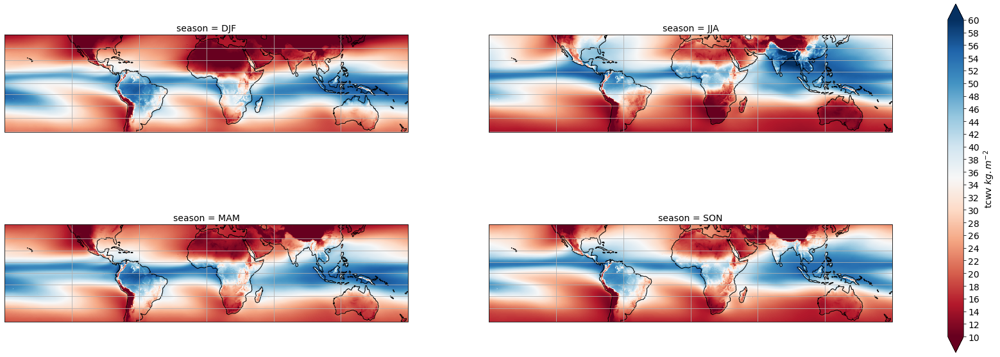

In [23]:
p = ds_MSS['tcwv_smooth'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'season', col_wrap =2,
                               aspect = 3, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                               cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
    
plt.savefig(output_fig+'atlas_meanSeason_clim.png')

# Calcul et carte de variance pour la variable tcwv

\begin{equation}
\sigma_j = \sqrt{\frac{\displaystyle\sum_{i=1}^{n_j}((< \overline{x}_{30} >_3)_i - \mu^*_j)^2} {n_j}} \\
\text{$j$ de 1 à 12 ou de 1 à 4, $\mu_j$ la moyenne climatologique, n le nombre de pas de temps $n_j = nbAnnee * nbJour_j * \frac{24}{3}$}
\end{equation}

In [24]:
ds_std_smot = ds_smot.std('time')
ds_std_smot_M = ds_smot.groupby('time.month').std('time').load()
ds_std_smot_S = ds_smot.groupby('time.season').std('time').load()

ds_std_brut = ds_brut.std('time')
ds_std_brut_M = ds_brut.groupby('time.month').std('time')
ds_std_brut_S= ds_brut.groupby('time.season').std('time')



#### Parameter for plotting
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(0.,5.1,0.5),
            'extend' : 'max'}
vmax = 5.
vmin = 0.
cmap ='RdBu'
size = 5
aspect = 4

#### Atlas de la variance sur les douze mois 

/home/durandy/miniconda3/envs/towel/lib/python3.9/site-packages/xarray/plot/facetgrid.py:394: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout()


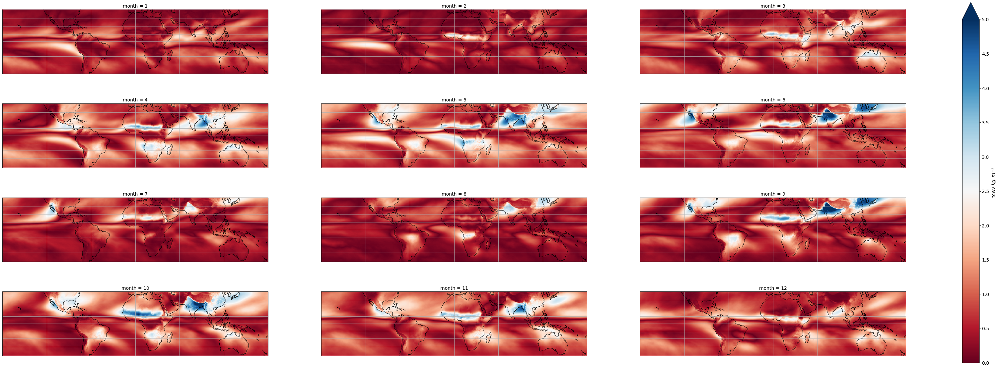

In [25]:
p = ds_std_smot_M['tcwv_smooth'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'month', col_wrap =3,
                               aspect = aspect, size = size,
                               vmin = 0., vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                               cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
    
# plt.show()
plt.savefig(output_fig+'atlas_varMonth_clim.png')

#### Atlas de la variance saisonière

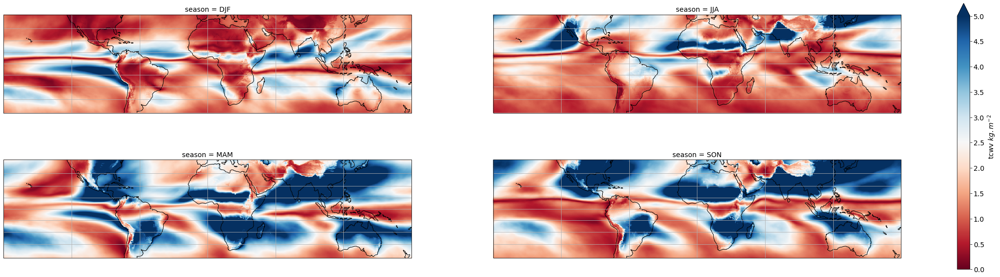

In [26]:
# plt.figure(figsize = (30,10))
p = ds_std_smot_S['tcwv_smooth'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'season', col_wrap =2,
                               aspect = aspect, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                              cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
plt.savefig(output_fig+'atlas_varSeason_clim.png')

#### Variance sur l'année

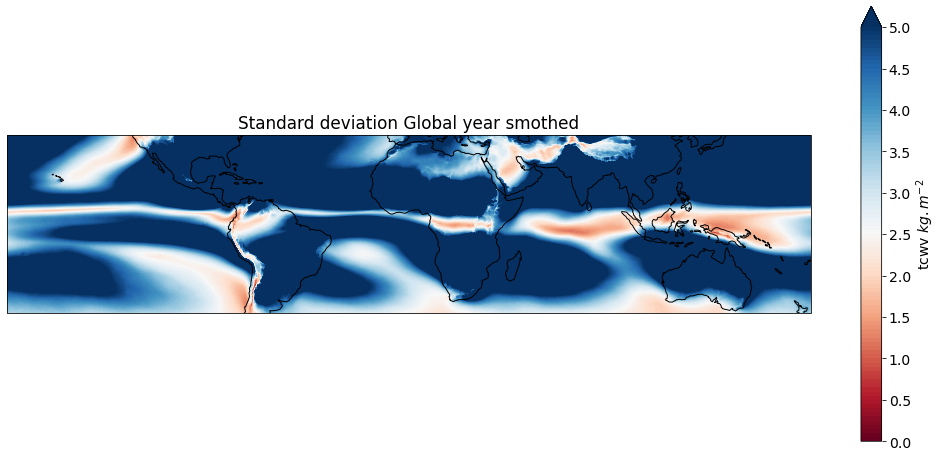

In [27]:
plt.figure()
ax = plt.axes(projection=ccrs.PlateCarree())
p = ds_std_smot['tcwv_smooth'].plot.contourf(levels = 101, vmax = vmax,vmin = vmin, cmap=cmap,
                                                      cbar_kwargs=colorbar)
ax.coastlines()
plt.title("Standard deviation Global year smothed")
plt.show()

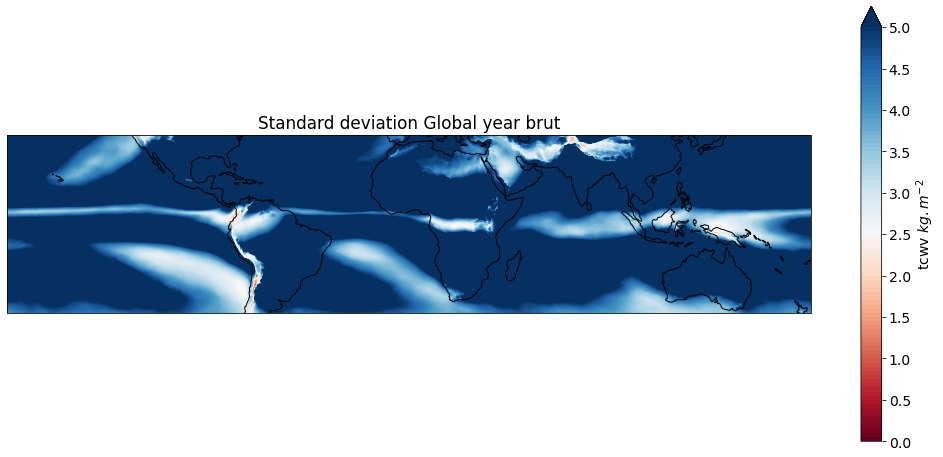

In [28]:
plt.figure()
ax = plt.axes(projection=ccrs.PlateCarree())
p = ds_std_brut['tcwv'].plot.contourf(levels = 101, vmax = vmax, vmin = vmin, cmap='RdBu',
                                                      cbar_kwargs=colorbar)
ax.coastlines()
plt.title("Standard deviation Global year brut")
plt.show()

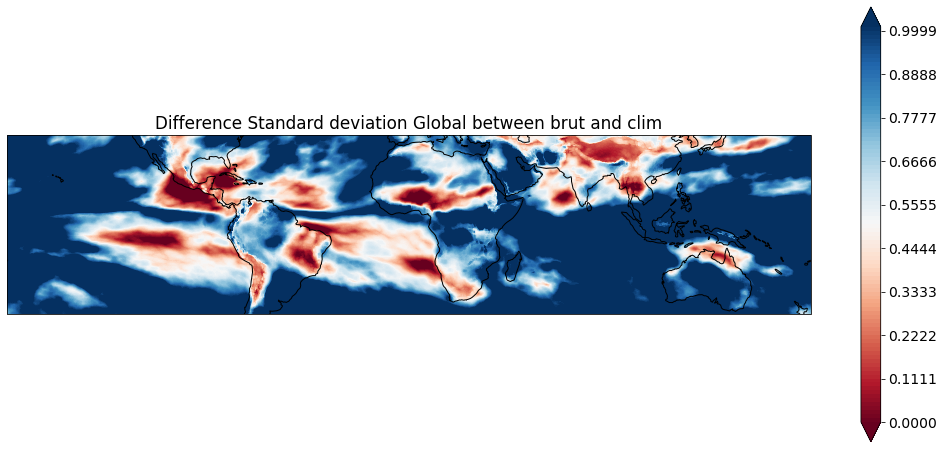

In [29]:
diff = ds_std_brut['tcwv']-ds_std_smot['tcwv_smooth']

plt.figure()
ax = plt.axes(projection=ccrs.PlateCarree())
p = diff.plot.contourf(levels = 101, vmax = 1.01, vmin = vmin, cmap='RdBu'
                      )
ax.coastlines()
plt.title("Difference Standard deviation Global between brut and clim")
plt.show()

In [30]:
# plt.figure()
# ax = plt.axes(projection=ccrs.PlateCarree())
# p = ds_MMS['tcwv_smooth'].sel(month = 9).plot.contourf(levels = 101, vmax = 60.,vmin = 0., cmap='RdBu_r',
#                                                       cbar_kwargs={'label': 'tcwv $kg.m^{-2}$',
#                        'orientation': 'vertical' , 'ticks': np.arange(0.,61,5)
#                         , 'extend' : 'both'})
# ax.coastlines()
# plt.title("Septembre")
# plt.show()